# BE - Apprentissage Automatique
## _Set de données : Higgs_ :
## Auteurs : Benoît Keryer, Quentin Chevaux

Mots-clés : classification, feature/target, apprentissage supervisé, feature engineering, corrélation, hyperparamètre, cross-validation, training-testing dataset


Le dataset est téléchargeable à l'adresse https://archive.ics.uci.edu/dataset/280/higgs

La deuxième cellule de code permet de l'échantillonner en un fichier de taille plus raisonnable. Pour cela, il doit être nommé HIGGS.csv et placé dans le dossier ./higgs

Pour récupérer le dataset déjà échantillonné, vous pouvez aller sur le repository github suivant : https://github.com/Strato31/BE-machine-learning


# Sommaire
- I - Phase d'exploration
- II - Phase d’ingénierie des caractéristiques
- III - Phase d’apprentissage
- IV - Phase d’ajustement des hyperparamètres
- V - Conclusion

In [1]:
# importations
import get_data as get
from sklearn.decomposition import PCA
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Sampling du dataset initial de 8Go (!) en versions plus légères

# Fonctions permettant de charger et d'échantillonner les données
def load_data():
    """Récupérer chunk par chunk pour éviter les problèmes de mémoire."""
    chunk_size = 1000000
    data_chunks = []
    for chunk in pd.read_csv('./higgs/HIGGS.csv', chunksize=chunk_size):
        data_chunks.append(chunk)
        print("chunk loaded, current shape :", len(data_chunks))
    data = pd.concat(data_chunks, ignore_index=True)

    return data

def sample_data(file_name='HIGGS', sample_size=1000000, random_state=42):
    """Échantillonner les données pour une analyse plus rapide."""
    data = load_data()
    data_samples = data.sample(n = sample_size, random_state=random_state)
    data_samples.to_csv(f'./higgs/{file_name}.csv', index=False)

# Création d'un échantillon de 10 000 lignes
# sample_data(sample_size=10000)  # Décommentez cette ligne pour créer un échantillon

# I - Phase d'exploration

Le jeu de données HIGGS provient de la physique des particules. Il a pour objectif de distinguer un processus « signal », correspondant à la production d’un boson de Higgs, d’un processus de « fond » (background). Ce jeu de données contient 11 millions d’instances, chacune décrite par 28 caractéristiques numériques continues : 21 dites de bas niveau et 7 de haut niveau (variables dérivées des 21). Les 21 variables de bas niveau proviennent des capteurs de l'expérience. Par exemple, la seconde feature est le moment transverse du lepton, la troisième est la pseudo-rapidité du lepton, etc... Vous pourrez retrouver les noms des variables sur la page du dataset https://archive.ics.uci.edu/dataset/280/higgs et sur l'article associé : https://www.nature.com/articles/ncomms5308.

L'objectif est de prédire la target qui est la première feature (signal ou bruit) pour chaque enregistrement.

Le fichier csv complet pèse environ 8 Go, ce qui rend son traitement complet coûteux en mémoire et en temps de calcul. Pour cette raison, nous choisirons dans un premier temps de travailler sur un échantillon représentatif du jeu de données, afin de faciliter le traitement du jeu de données.

In [2]:
# Charger les données échantillonnées
df = pd.read_csv('./higgs/HIGGS_small_sample.csv')
df.columns = ['label'] + [f'feature_{i}' for i in range(df.shape[1]-1)] 

# # Filtrer pour ne garder que les signaux ou le bruit
# df_signal = df[df['label'] == 1].drop(columns=['label'])
# df_noise = df[df['label'] == 0].drop(columns=['label'])

In [12]:
# Aperçu général du dataset
print("Aperçu du dataset complet :")
print(df.head(), "\n")

print("Quelques statistiques du dataset pour chaque feature :")
print(df.describe(), "\n")

Aperçu du dataset complet :
   label  feature_0  feature_1  feature_2  feature_3  feature_4  feature_5  \
0    1.0   1.407889  -0.559112  -1.054480   1.081082  -0.757415   0.761531   
1    1.0   0.481863  -0.318542   1.040227   0.860108  -0.348366   0.792677   
2    1.0   1.072616   0.225907   1.210569   1.110878  -1.457522   1.581599   
3    1.0   0.866365   1.400513   0.625745   1.029766  -1.230208   0.545979   
4    1.0   0.857947   0.518097  -0.500171   1.129513  -1.508554   0.888040   

   feature_6  feature_7  feature_8  ...  feature_18  feature_19  feature_20  \
0  -0.510984   0.347754   0.000000  ...    1.288750    0.205711    3.101961   
1   0.362399   0.986395   2.173076  ...    0.999760    1.166819    0.000000   
2   1.239742   0.770743   0.000000  ...    0.360152   -0.714994    1.550981   
3   0.408940  -0.065912   2.173076  ...    0.903153   -0.031894    0.000000   
4  -0.155492   0.254619   0.000000  ...   -0.561784   -1.669997    3.101961   

   feature_21  feature_22  f

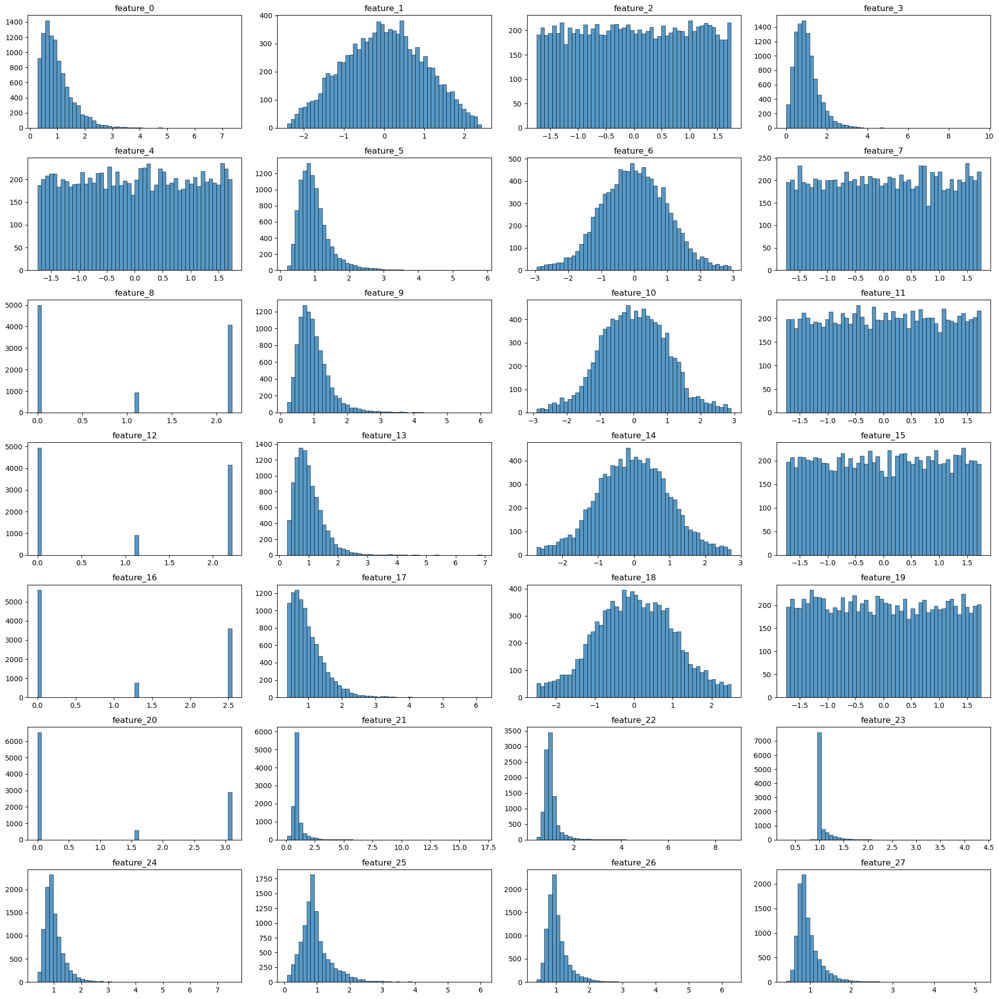

In [ ]:
# Regardons rapidement comment sont distribuées les features

# Supprimer la colonne label pour ne regarder que les features
features = df.drop(columns=['label'])

# Paramètres pour la grille de subplots
n_rows, n_cols = 7, 4  # 7 lignes × 4 colonnes = 28 features
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 20))
axes = axes.flatten() 

# Tracer les histogrammes
for i, col in enumerate(features.columns):
    sns.histplot(features[col], bins=50, kde=False, ax=axes[i])
    axes[i].set_title(col)
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')

plt.tight_layout()
plt.show()

Nous remarquons que la plupart des variables suivent approximativement une loi normale ou bien une loi du Chi 2 ou bien une loi uniforme sauf pour les features 8, 12, 16 et 20 qui ne prennent que 3 valeurs. Ces features représentent des scores de "b-tagging" des jets produits dans la collision, leur valeur pourrait representer la position du jet sur une cible. Cette discrétisation peut notamment refléter les spins des particules, qui ne prennent que des valeurs quantifiées.

Maintenant, nous allons voir rapidement la corrélation entre les variables.


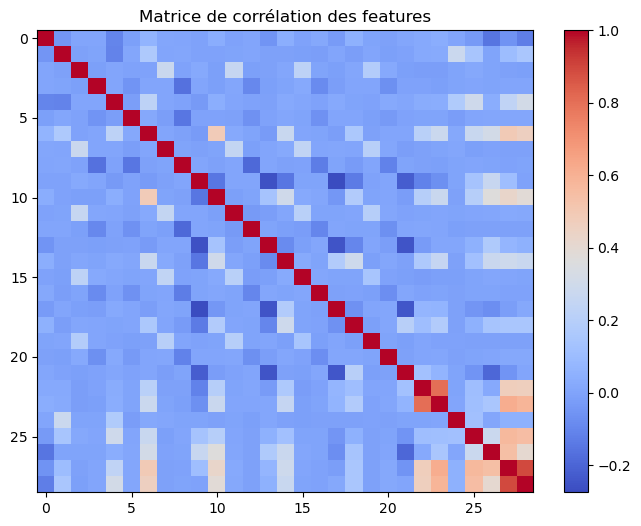

In [14]:
# Calculer la corrélation entre les features
corr = df.corr()

# Afficher la matrice de corrélation
plt.figure(figsize=(8,6))
plt.imshow(corr, interpolation='nearest', aspect='auto', cmap='coolwarm')
plt.colorbar()
plt.title('Matrice de corrélation des features')
plt.show()

- 1ère remarque :
la plupart des covariances sont inférieurs à 0.5. Ce qui indique que chaque variable vient potentielement apporter de l'information indépendant des autres. C'est-à-dire qu'il y a peu de redondances entre les variables, donc que la plupart des variables ne sont pas fortement linéairement corrélées. Cela peut indiquer que les relations entre variables ne sont pas linéaires et donc que les modèles capturant les non-linéarités comme les arbres seront meilleurs sur les autres. . Enfin, dans le cadre d’une analyse en composantes principales (PCA), la variance expliquée sera dispersée entre les premières composantes.

- 2ème remarque : 
Les 7 dernières variables (donc la matrice carrée 7x7 en bas de la matrice de corrélation) sont en moyenne plus corrélées entre elles qu'avec les autres. Ce qui est normal, car ce sont les 7 dernières variables dérivées des 21 autres. Donc elles partagent forcèment plus d'information en commun, et sont donc plus corrélées entre elles.


Nous pouvons faire un pairplot pour visualiser les corrélations quand il y en a, mais aussi pour détecter facilement des anomalies ou des valeurs aberrantes. 

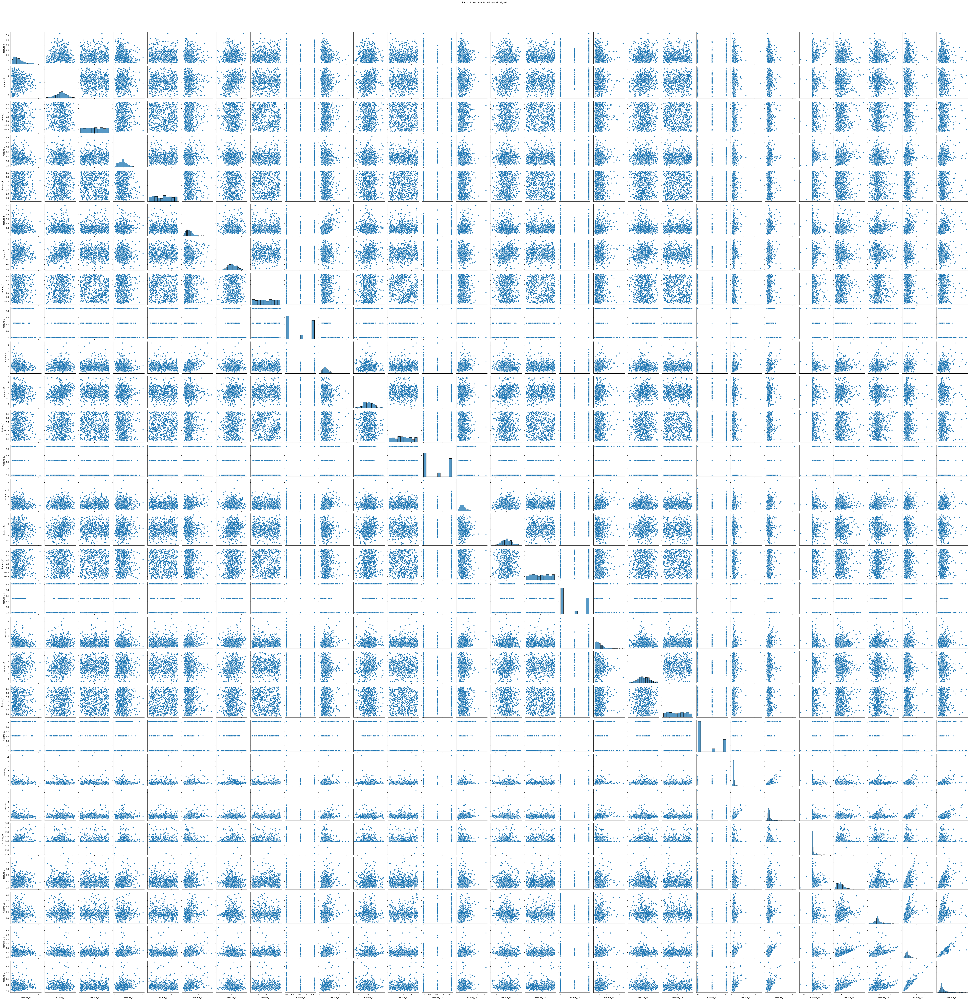

In [15]:
# plot de chaque caractéristique en fonction des autres pour visualiser des patterns
import seaborn as sns
sns.pairplot(df_signal.sample(n=500, random_state=42))
plt.suptitle('Pairplot des caractéristiques du signal', y=1.02)
plt.show()


Avec le pairplot, il est clair que certaines variables sont peut corrélées tandis que d'autres sont fortement corrélées comme par exemple les deux dernières variables, où nous voyons bien la corrélation.
Faisons maintenant une PCA, pour vérifier que la variance expliquée par les premières composantes soit dispersée, puisque la majorité des covariances sont faibles.

Explained variance ratio: [0.1128419  0.0960816  0.08488035 0.06942041 0.06273484] | total: 0.42595910318315233


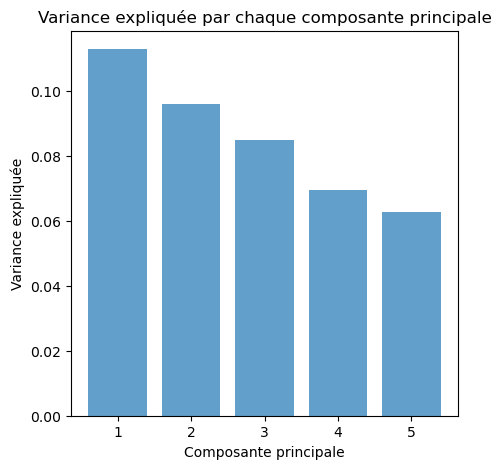

In [11]:
# Appliquer PCA pour réduire à 2 dimensions
pca = PCA(n_components=5)
pca_result = pca.fit_transform(df)

# Afficher la variance expliquée par chaque composante principale dans un graphique
explained_variance = pca.explained_variance_ratio_
print("Explained variance ratio:", explained_variance, '| total:', sum(explained_variance))
plt.figure(figsize=(5, 5))
plt.bar(range(1, len(explained_variance) + 1), explained_variance, alpha=0.7, align='center')
plt.xlabel('Composante principale')
plt.ylabel('Variance expliquée')
plt.title('Variance expliquée par chaque composante principale')
plt.show()
# Créer un DataFrame pour les résultats PCA
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2', 'PCA3', 'PCA4', 'PCA5'])


On observe que même avec 5 composantes principales, on ne parvient même pas à expliquer la moitié de la variance. On peut donc en conclure que la variance expliquée est plutôt dispersée.

Cependant, nous pouvons toute de même faire un k-means avec les deux premières composantes de la PCA pour détecter deux groupes dans les données (signal et bruit).

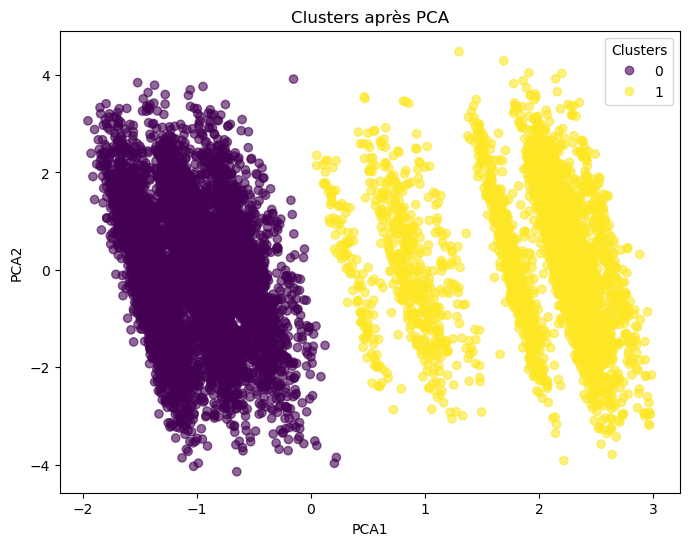

Adjusted Rand Index : -0.00031987746250739066


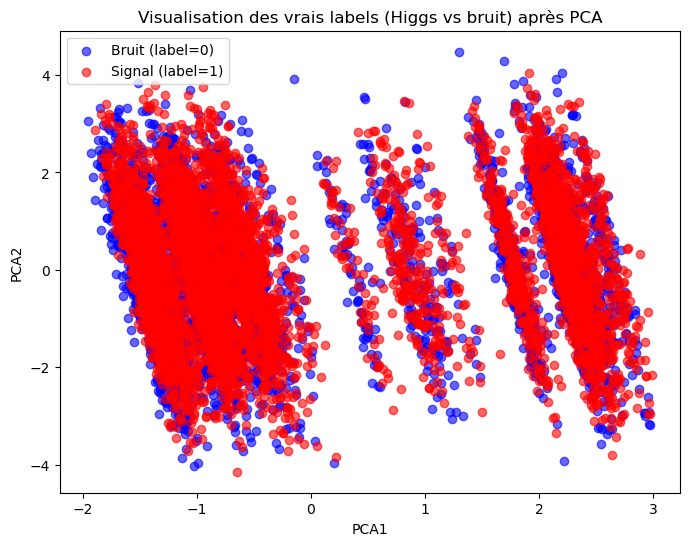

In [16]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=2, random_state=42)
kmeans.fit(pca_df)
labels = kmeans.labels_
pca_df['Cluster'] = labels

# Visualiser les clusters
plt.figure(figsize=(8, 6))
scatter = plt.scatter(pca_df['PCA1'], pca_df['PCA2'], c=pca_df['Cluster'], cmap='viridis', alpha=0.6)
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Clusters après PCA')
plt.legend(*scatter.legend_elements(), title='Clusters')
plt.show()

# Ici, nous souhaitons compar les clusters trouvés par KMeans avec les labels réels
# donc nous rajoutons la colonne des labels
pca_df['true_label'] = df['label'].values
# Ensuite, nous utilisons l'"Adjusted Rand Index" (ARI) pour mesurer la similarité entre les deux partitions
# Si ARI = 1, les clusters correspondent parfaitement aux vrais labels, si ARI = 0, la correspondance est due au hasard. Si ARI < 0, la correspondance est pire que le hasard.
# Plus d'informations sur l'ARI ici : https://scikit-learn.org/stable/modules/generated/sklearn.metrics.adjusted_rand_score.html
from sklearn.metrics import adjusted_rand_score
ari = adjusted_rand_score(pca_df['true_label'], pca_df['Cluster'])
print("Adjusted Rand Index :", ari)


# Plot les points selon les vrais labels pour comparer visuellement avec les clusters obtenus
plt.figure(figsize=(8,6))

# Différencier les points selon les vrais labels
plt.scatter(
    pca_df[pca_df['true_label'] == 0]['PCA1'],
    pca_df[pca_df['true_label'] == 0]['PCA2'],
    c='blue', alpha=0.6, label='Bruit (label=0)'
)

plt.scatter(
    pca_df[pca_df['true_label'] == 1]['PCA1'],
    pca_df[pca_df['true_label'] == 1]['PCA2'],
    c='red', alpha=0.6, label='Signal (label=1)'
)
# Titres
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.title('Visualisation des vrais labels (Higgs vs bruit) après PCA')

plt.legend()
plt.show()

Si nous comparons qualitativement les deux groupes formés par le KMeans avec la visualisation des vrais labels, nous remarquons que les clusters obtenus ne représentent pas du tout un groupe signal et un groupe bruit. Pour quantifier cette observation, nous pouvons utiliser l’Adjusted Rand Index (ARI) afin d’évaluer dans quelle mesure les clusters permettent de distinguer un signal d’un bruit. Nous obtenons un ARI d’environ -0,0003, ce qui est très proche de 0 et indique donc qu’il n’existe aucune correspondance significative entre les clusters et la distinction signal/bruit.

# II - Phase d’ingénierie des caractéristiques



In [29]:
# on vérifie la présence de doublons dans le dataset 
duplicates = df.duplicated()
num_duplicates = duplicates.sum()
print(f"Nombre de doublons dans le dataset : {num_duplicates}")

Nombre de doublons dans le dataset : 0


Comme vu dans la phase précédente, nous n'avons pas détecté d'anomalies. Le set ne contient aucune valeur manquante ni particulièrement aberrante d'après les résultats de la phase d'exploration, ni de doublons. Donc nous n'avons pas besoin de les corriger. Ensuite, il n'est pas intéressant de créer des nouvelles variables étant donné que les 7 dernières variables sont déjà des variables créées à partir des 21 premières. De plus, il n'est pas intéressant de choisir certaines variables ou composantes de la PCA, car la variance expliquée est très dispersée le long des composantes. Donc pour cette phase, nous avons choisi de conserver les données telles quelles, à l'exception de l'échantillonage de départ pour alléger de traitement des données et accélérer l'entraînement des modèles.

# III - Phase d'apprentissage

Dans cette troisième partie, nous allons tester différents modèles. Avec une sélection différentes des features (A, B ou C). Vous pouvez choisir les features à tester en exécutant seulement la cellule correspondante.
D'après le set de données et le problème posé, nous allons recourir à des algorithmes d'apprentissage automatique supervisé de classification.

In [17]:
# A) Avec toutes les features
from sklearn.model_selection import train_test_split
X = df.drop(columns=['label'])
y = df['label']
#Séparation du dataset en un ensemble d'entraînement et un ensemble de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# B) Sans les features haut niveau
from sklearn.model_selection import train_test_split
X = df.iloc[:, :21].drop(columns=['label'])
y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# C) Avec uniquement les features haut niveau (features 22 et plus)
from sklearn.model_selection import train_test_split
X = df.iloc[:, 22:]
y = df['label']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

Après avoir séparé notre dataset, nous allons comparer plusieurs modèles entre eux.

In [ ]:
# Modèle Random Forest
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier(n_estimators=100, random_state=42)
model.fit(X_train, y_train) # entraînement du modèle
accuracy = model.score(X_test, y_test) # évaluation du modèle
print(f'Accuracy du modèle Random Forest: {accuracy * 100:.2f}%')

Accuracy du modèle Random Forest: 68.75%


In [26]:
# Modèle XGBoost
import xgboost as xgb
xgb_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_accuracy = xgb_model.score(X_test, y_test)
print(f'Accuracy du modèle XGBoost: {xgb_accuracy * 100:.2f}%')

Accuracy du modèle XGBoost: 71.35%


In [9]:
# Modèle SGDClassifier
from sklearn.linear_model import SGDClassifier
sgd_model = SGDClassifier(max_iter=1000, tol=1e-3, random_state=42)
sgd_model.fit(X_train, y_train)
sgd_accuracy = sgd_model.score(X_test, y_test)
print(f'Accuracy du modèle SGDClassifier: {sgd_accuracy * 100:.2f}%')

Accuracy du modèle SGDClassifier: 58.80%


In [8]:
# Modèle Gradient Boosting Classifier
from sklearn.ensemble import GradientBoostingClassifier
gbc_model = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
gbc_model.fit(X_train, y_train)
gbc_accuracy = gbc_model.score(X_test, y_test)
print(f'Accuracy du modèle Gradient Boosting Classifier: {gbc_accuracy * 100:.2f}%')

Accuracy du modèle Gradient Boosting Classifier: 72.35%


On retient le modèle xgboost pour notre analyse, puisqu'il combine une excellente vitesse d'entraînement et parmi les meilleurs résultats sans réglage manuel des hyperparamètres. De plus, comme le nombre de "négatifs" (il y a 1042 signals) et de "positifs" (il y a 958 bruits) est équilibré prendre comme critère l'accuracy est pertinent. En effet, cela n'aurait pas été le cas s'il y avait eu par exemple 1% de négatifs.
Nous allons maintenant passer à une évaluation plus complète de notre modèle enfin de mieux le caractériser. Pour cela, nous allons faire une matrice de confusion et calculer d'autres métriques comme le score f1.

In [20]:
# Modèle XGBoost
xgb_model = xgb.XGBClassifier(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_accuracy = xgb_model.score(X_test, y_test)
print(f'Accuracy du modèle XGBoost: {xgb_accuracy * 100:.2f}%')

from sklearn.metrics import classification_report, confusion_matrix

y_pred = xgb_model.predict(X_test)
print("Matrice de confusion pour le modèle XGBoost:")
print(confusion_matrix(y_test, y_pred))
print("\n")
print("Rapport de classification pour le modèle XGBoost:")
print(classification_report(y_test, y_pred))

Accuracy du modèle XGBoost: 72.30%
Matrice de confusion pour le modèle XGBoost:
[[668 290]
 [264 778]]


Rapport de classification pour le modèle XGBoost:
              precision    recall  f1-score   support

         0.0       0.72      0.70      0.71       958
         1.0       0.73      0.75      0.74      1042

    accuracy                           0.72      2000
   macro avg       0.72      0.72      0.72      2000
weighted avg       0.72      0.72      0.72      2000



On remarque que notre modèle est meilleur pour détecter les signaux que le bruit (recall de 0.75 pour les signaux vs 0.70 pour le bruit). En revanche, notre modèle confond encore un nombre non négligeable de cas positifs comme négatifs (290 faux négatifs), indiquant un léger déséquilibre dans la classification.

# IV - Phase d’ajustement des hyperparamètres

Pour choisir les bonnes valeurs d'hyperparamètres, nous entraînons le modèle pour différentes valeurs d'un hyperparamètre, enregistrons les accuracy obtenues, puis visualisons l’impact de l'hyperparamètre sur les performances.


Learning rate: 0.0010, Accuracy moyenne (3-fold CV): 57.55%
Learning rate: 0.0111, Accuracy moyenne (3-fold CV): 67.83%
Learning rate: 0.0212, Accuracy moyenne (3-fold CV): 68.78%
Learning rate: 0.0313, Accuracy moyenne (3-fold CV): 69.55%
Learning rate: 0.0414, Accuracy moyenne (3-fold CV): 70.13%
Learning rate: 0.0515, Accuracy moyenne (3-fold CV): 70.29%
Learning rate: 0.0615, Accuracy moyenne (3-fold CV): 70.52%
Learning rate: 0.0716, Accuracy moyenne (3-fold CV): 70.66%
Learning rate: 0.0817, Accuracy moyenne (3-fold CV): 70.66%
Learning rate: 0.0918, Accuracy moyenne (3-fold CV): 71.15%
Learning rate: 0.1019, Accuracy moyenne (3-fold CV): 71.28%
Learning rate: 0.1120, Accuracy moyenne (3-fold CV): 71.24%
Learning rate: 0.1221, Accuracy moyenne (3-fold CV): 71.00%
Learning rate: 0.1322, Accuracy moyenne (3-fold CV): 70.94%
Learning rate: 0.1423, Accuracy moyenne (3-fold CV): 71.22%
Learning rate: 0.1524, Accuracy moyenne (3-fold CV): 71.35%
Learning rate: 0.1625, Accuracy moyenne 

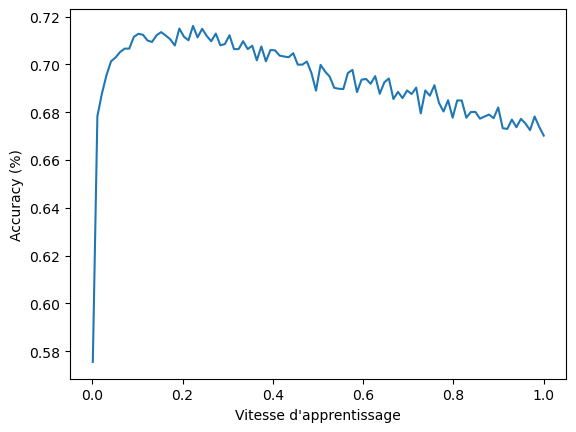

In [ ]:
import numpy as np
from sklearn.model_selection import cross_val_score
params = {'max_depth':3,
          'n_estimators': 100,
          'gamma': 0.1,
          'reg_alpha': 0.01,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']

acc_hist = []
lr_hist = np.linspace(0.001,1,100)

# ici nous allons utiliser la validation croisée pour une évaluation plus robuste
for lr in lr_hist:
    model = xgb.XGBClassifier(learning_rate=lr, **params)
    # Cross-validation à 3 folds
    scores = cross_val_score(model, X, y, cv=3, scoring='accuracy')
    acc_hist.append(scores.mean())  # moyenne des 3 folds
    print(f'Learning rate: {lr:.4f}, Accuracy moyenne (3-fold CV): {scores.mean() * 100:.2f}%')

plt.figure()
plt.plot(lr_hist, acc_hist)
plt.xlabel("Vitesse d'apprentissage")
plt.ylabel("Accuracy (%)")
plt.show()
    



On choisit, au vu des résultats précédents, une vitesse d'apprentissage de 0.1

Réglons maintenant le nombre d'arbres optimal.

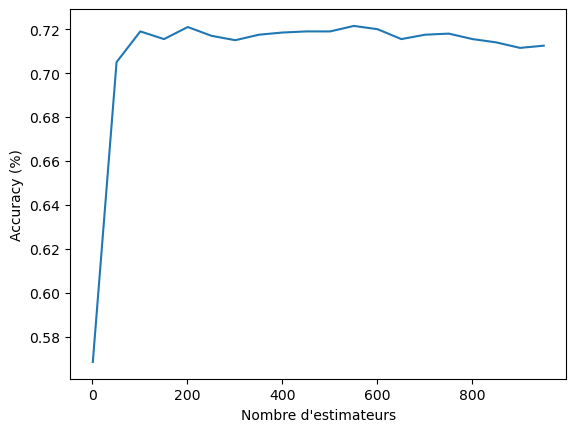

max accuracy : 0.7215
nb arbres opti : 551


In [ ]:
params = {'learning_rate':0.1,
          'max_depth':3,
          'gamma': 0.1,
          'reg_alpha': 0.01,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']
acc_hist = []
ne_hist = np.arange(1, 1000, 50)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
for ne in ne_hist:
    model = xgb.XGBClassifier(n_estimators=ne, **params)
    model.fit(X_train, y_train)
    acc_hist.append(model.score(X_test, y_test))

plt.figure()
plt.plot(ne_hist, acc_hist)
plt.xlabel("Nombre d'estimateurs")
plt.ylabel("Accuracy (%)")
plt.show()
indice_opti = np.argmax(acc_hist)
print(f'max accuracy : {np.max(acc_hist)}')
print(f'nb arbres optimal : {ne_hist[indice_opti]}')

On n'observe pas d'amélioration significative du modèle au-delà de 200 arbres, c'est le nombre d'estimateurs que l'on choisira de conserver.

Réglons les paramètres d'arbre, nommément le max_depth et le gamma.

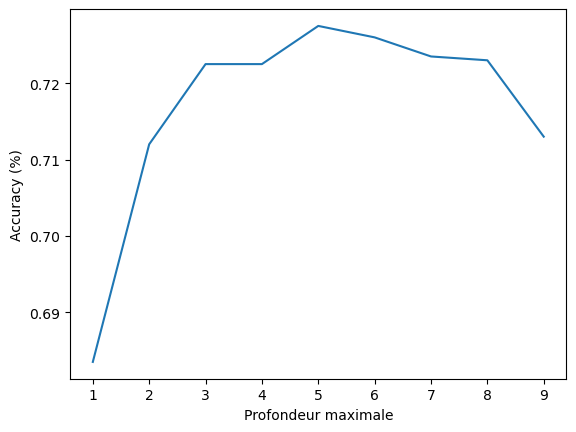

In [28]:
params = {'learning_rate':0.1,
          'n_estimators': 200,
          'gamma': 0.1,
          'reg_alpha': 0.01,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']
acc_hist = []
md_hist = np.arange(1, 10, 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
for md in md_hist:
    model = xgb.XGBClassifier(max_depth=md, **params)
    model.fit(X_train, y_train)
    acc_hist.append(model.score(X_test, y_test))

plt.figure()
plt.plot(md_hist, acc_hist)
plt.xlabel("Profondeur maximale")
plt.ylabel("Accuracy (%)")
plt.show()

On retient une profondeur maximale optimale de 5.

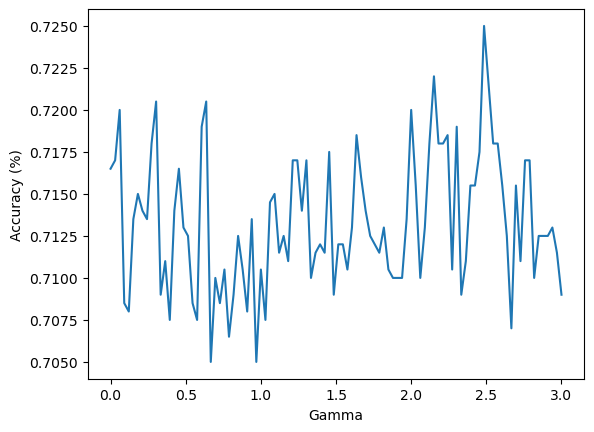

In [29]:
params = {'learning_rate':0.1,
          'n_estimators': 200,
          'max_depth': 5,
          'reg_alpha': 0.01,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']
acc_hist = []
g_hist = np.linspace(0, 3, 100)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
for g in g_hist:
    model = xgb.XGBClassifier(gamma=g, **params)
    model.fit(X_train, y_train)
    acc_hist.append(model.score(X_test, y_test))

plt.figure()
plt.plot(g_hist, acc_hist)
plt.xlabel("Gamma")
plt.ylabel("Accuracy (%)")
plt.show()

Changer la valeur de gamma ne change pas conséquemment l'efficacité du modèle, on conservera donc la valeur par défaut de 0.1

Réglons enfin les paramètres de régularisation reg_alpha (L1) et reg_lambda (L2).

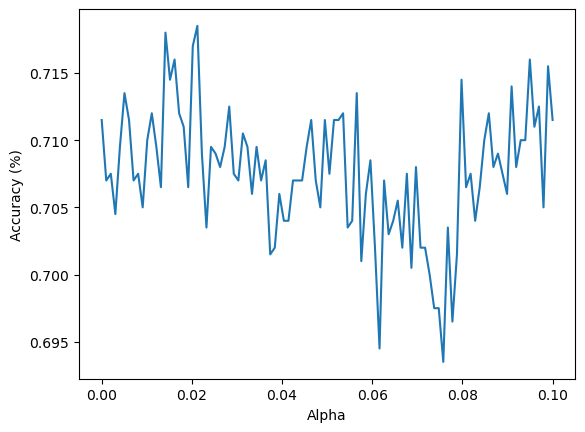

In [30]:
params = {'learning_rate':0.1,
          'n_estimators': 200,
          'max_depth': 5,
          'gamma': 0.1,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']
acc_hist = []
al_hist = np.linspace(0, 0.1, 100)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
for a in al_hist:
    model = xgb.XGBClassifier(reg_alpha=a, **params)
    model.fit(X_train, y_train)
    acc_hist.append(model.score(X_test, y_test))

plt.figure()
plt.plot(al_hist, acc_hist)
plt.xlabel("Alpha")
plt.ylabel("Accuracy (%)")
plt.show()

On garde reg_alpha = 0.07

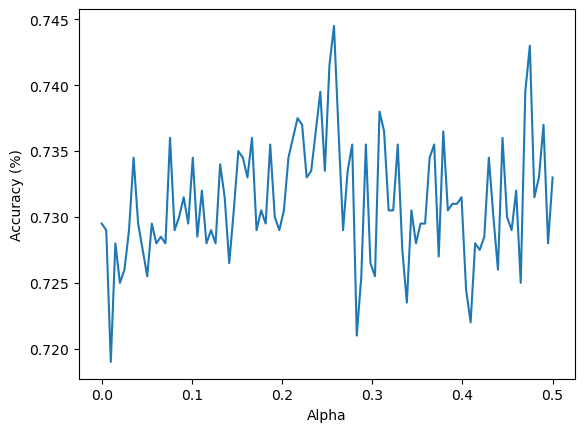

In [31]:
params = {'learning_rate':0.1,
          'n_estimators': 200,
          'max_depth': 5,
          'gamma': 0.1,
          'reg_alpha': 0.07,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']
acc_hist = []
la_hist = np.linspace(0, 0.5, 100)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
for l in la_hist:
    model = xgb.XGBClassifier(reg_lambda=l, **params)
    model.fit(X_train, y_train)
    acc_hist.append(model.score(X_test, y_test))

plt.figure()
plt.plot(la_hist, acc_hist)
plt.xlabel("Alpha")
plt.ylabel("Accuracy (%)")
plt.show()

On ne distingue pas d'effet significatif de changer la régularisation L2, donc on conserve reg_lambda à sa valeur par défaut de 0.01


In [28]:
from sklearn.model_selection import train_test_split
import xgboost as xgb
params = {'learning_rate':0.1,
          'n_estimators': 200,
          'max_depth': 5,
          'gamma': 0.1,
          'reg_alpha': 0.07,
          'reg_lambda': 0.01,
          'random_state':42}

X = df.drop(columns=['label'])
y = df['label']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

model = xgb.XGBClassifier(**params)
model.fit(X_train, y_train)
print("accuracy du modèle réglé : ",model.score(X_test, y_test))

accuracy du modèle réglé :  0.7025


Le réglage des hyperparamètres n'a pas permis d'évolution significative dans la précision du modèle. On en déduit que les paramètres par défaut sont bien réglés pour notre set de données.



# V - Conclusion

En conclusion, l’étude menée sur le jeu de données HIGGS montre que les caractéristiques fournies permettent une discrimination pertinente entre signal et bruit grâce à l'algorithme xgboost. Cela été permis grâce à une approche méthodique. Tout d'abord, nous avons exploré les données, nous avons vu qu'elles étaient déjà nettoyés, nous avons donc pu passer directement à l'étape suivante qui était de choisir le meilleur modèle. Après avoir trouvé le meilleur modèle (xgboost), nous avons cherché la meilleur combinaison d'hyperparamètres pour ce modèle, ce qui nous a permis de l'affiner légèrement.

Il serait pertinent de demander aux personnes du métier les relations physiques connues entre les différentes variables, la formule exacte des 7 dernières features, mais aussi les unités ou la normalisation appliquée. On pourrait aussi demander la façon dont a été généré le label signal/bruit, pour peut être déceler un bais dans la génération. 

Perspectives à explorer:
Dans la recherche des meilleurs hyperparamètres, nous avons changé les hyperparamètres l'un après l'autre. Or, pour améliorer notre modèle, nous pourrions explorer différentes stratégies d’optimisation des hyperparamètres afin de trouver la combinaison la plus performante. Parmi celles-ci, nous pourrions utiliser la recherche par grille (Grid Search) pour tester systématiquement toutes les combinaisons possibles, la recherche aléatoire (Random Search) pour échantillonner plus efficacement l’espace des paramètres, ou encore des approches plus avancées comme Bayesian Optimization, qui permettent de guider la recherche en fonction des résultats précédents. L’objectif serait d’identifier rapidement les réglages qui maximisent la performance tout en limitant le temps de calcul.

Egalement, nous aurions pu tester la création de features à partir des autres features, ou encore de sélectionner le meilleur modèle non pas sur une unique combinaison d'hyperparamètres mais sur un ensemble de combinaisons d'hyperparamètres.

Enfin, d'après l'article associé à ce jeu de données, il semble que les méthodes de deep learning seraient les plus adaptées pour traiter ce dataset.